INTRODUCTION

Crime incident reports are provided by Boston Police Department (BPD) to document the initial details surrounding an incident to which BPD officers respond. This is a dataset containing records from the new crime incident report system, which includes a reduced set of fields focused on capturing the type of incident as well as when and where it occurred.

Records begin in June 14, 2015 and continue to September 3, 2018. However for most of the analysis only the records of 2016 and 2017 were used since these years were fully recorded.

The data is provided by Analyze Boston. The most up-to-date version can be found at 
https://data.boston.gov/dataset/crime-incident-reports-august-2015-to-date-source-new-system

Questions that we want to answer:
What is the most common type of police respone?
How does the number of responses change depending on the time of the day?
How does the number of responses change during the week?
How does the number of responses change during the year?
Does responses increase during the holidays?
How are the responses distrobuted in the city?
How are the number of shootings distrobuted in the city?
How many percent of responses are shootings?
What type of response types involves the most shootings?


METHODS

In [1]:
# Load libraries
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline 
import seaborn as sns
import folium
from folium.plugins import HeatMap

We use pandas for data manipulation, matplotlib and seanborn for plotting and folium to create a heatmap of the police responses.

In [2]:
# Import data
data = pd.read_csv('crimes-in-boston/crime.csv', encoding='latin-1')

Imports the csv file containing our data into a pandas dataframe

In [3]:
# Keep only data from complete years (2016, 2017)
data = data.loc[data['YEAR'].isin([2016,2017])]

We remove the incomplete years 2015 and 2018. This is done so that we can get an accurate analysis of how the responses vary during the year.

In [4]:
#Look at the data
data.head(100)

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
569,I182070304,1107,Fraud,FRAUD - IMPERSONATION,D4,905,NaN,2017-11-01 00:00:00,2017,11,Wednesday,0,Part Two,E BROOKLINE ST,42.339268,-71.072088,"(42.33926764, -71.07208833)"
744,I182070115,3114,Investigate Property,INVESTIGATE PROPERTY,D14,793,NaN,2017-10-11 17:43:00,2017,10,Wednesday,17,Part Three,KELTON ST,42.346501,-71.136128,"(42.34650102, -71.13612792)"
923,I182069920,3201,Property Lost,PROPERTY - LOST,B2,287,NaN,2017-08-31 12:08:00,2017,8,Thursday,12,Part Three,SHAWMUT AVE,42.331925,-71.084112,"(42.33192532, -71.08411222)"
1162,I182069657,1102,Fraud,FRAUD - FALSE PRETENSE / SCHEME,D14,774,NaN,2017-06-27 07:00:00,2017,6,Tuesday,7,Part Two,COMMONWEALTH AVE,42.338482,-71.152890,"(42.33848236, -71.15288978)"
1444,I182069334,3201,Property Lost,PROPERTY - LOST,B3,420,NaN,2017-12-08 22:00:00,2017,12,Friday,22,Part Three,MORTON ST,42.279591,-71.081323,"(42.27959103, -71.08132258)"
1813,I182068927,1107,Fraud,FRAUD - IMPERSONATION,C11,384,NaN,2016-01-10 00:00:00,2016,1,Sunday,0,Part Two,HILL TOP ST,42.280498,-71.048885,"(42.28049764, -71.04888519)"
1827,I182068912,3201,Property Lost,PROPERTY - LOST,A7,942,NaN,2017-01-30 19:00:00,2017,1,Monday,19,Part Three,VALLAR RD,42.392697,-71.008424,"(42.39269663, -71.00842413)"
1916,I182068812,3114,Investigate Property,INVESTIGATE PROPERTY,D14,791,NaN,2017-11-10 16:30:00,2017,11,Friday,16,Part Three,CAROL AVE,42.344980,-71.140906,"(42.34497953, -71.14090626)"
2302,I182068383,2610,Other,TRESPASSING,C6,220,NaN,2017-09-01 08:00:00,2017,9,Friday,8,Part Two,E BROADWAY,42.335468,-71.044891,"(42.33546813, -71.04489149)"
2974,I182067634,1106,Confidence Games,FRAUD - CREDIT CARD / ATM FRAUD,C11,244,NaN,2017-10-11 00:00:00,2017,10,Wednesday,0,Part Two,E COTTAGE ST,42.318532,-71.057790,"(42.31853245, -71.05778998)"


We take a look at the data to see what needs to be done.

In [5]:
#Look at the types of the columns
data.dtypes

INCIDENT_NUMBER         object
OFFENSE_CODE             int64
OFFENSE_CODE_GROUP      object
OFFENSE_DESCRIPTION     object
DISTRICT                object
REPORTING_AREA          object
SHOOTING                object
OCCURRED_ON_DATE        object
YEAR                     int64
MONTH                    int64
DAY_OF_WEEK             object
HOUR                     int64
UCR_PART                object
STREET                  object
Lat                    float64
Long                   float64
Location                object
dtype: object

We check the column types to make sure everything looks ok.

In [6]:
# Remove unused columns
data = data.drop(['INCIDENT_NUMBER', 'Location'], axis=1)

We remove the columns INCIDENT_NUMBER and Location because we wont be using these for the analysis. INCIDENT_NUMBER just gives a unique value for every response and Location gives the coordinates of the response in a tuple. There are seperate columns for latitude and longitude so the Location column is redundant.

In [7]:
# Convert OCCURED_ON_DATE to datetime
data['OCCURRED_ON_DATE'] = pd.to_datetime(data['OCCURRED_ON_DATE'])

We convert the date of the respone into a format that pandas is designed to handle.

In [8]:
# Fill in nans in SHOOTING column
data.SHOOTING.fillna('N', inplace=True)

Replace every NaN in the SHOOTING column with the letter N, The letter N represents No Shooting. It was quite strange that they decided to assign NaN for no shooting in the dataset.

In [9]:
# Convert DAY_OF_WEEK to an ordered category
data.DAY_OF_WEEK = pd.Categorical(data.DAY_OF_WEEK, 
              categories=['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'],
              ordered=True)

We make the DAY_OF_WEEK column into an ordered catagory, this is done so that if we plot the data in this column the days will be plotted in the correct order. If we did not do this then the column would be alphabetically ordered.

In [10]:
# Replace -1 values in Lat/Long with Nan
data.Lat.replace(-1, None, inplace=True)
data.Long.replace(-1, None, inplace=True)

In the dataset they decided to assign -1 to the latitude and longitude values that were missing. We change these to NaN.

In [11]:
# Rename columns to something easier to type (the all-caps are annoying!)
rename = {'OFFENSE_CODE_GROUP':'Group',
         'OFFENSE_DESCRIPTION':'Description',
         'DISTRICT':'District',
         'REPORTING_AREA':'Area',
         'SHOOTING':'Shooting',
         'OCCURRED_ON_DATE':'Date',
         'YEAR':'Year',
         'MONTH':'Month',
         'DAY_OF_WEEK':'Day',
         'HOUR':'Hour',
         'STREET':'Street'}
data.rename(index=str, columns=rename, inplace=True)

We just rename the columns to make them easier to type.

In [12]:
#Building DF Districts
districts = {'A1':'Downtwon', 'A15':'Charlestown', 'A7':'East Boston', 'B2':'Roxbury', 
             'B3':'Mattapan', 'C11':'Dorchester', 'C6':'South Boston', 'D14':'Brighton', 
             'D4':'South End', 'E13':'Jamaica Plain', 'E18':'Hyde Park', 'E5':'West Roxbury'  
            } 
#Replace district names
data = data.replace(to_replace=districts)

We change the district codes to their actual names.

In [13]:
# Check how many NaN we have in each column
data.isnull().sum()

OFFENSE_CODE        0
Group               0
Description         0
District         1093
Area                0
Shooting            0
Date                0
Year                0
Month               0
Day                 0
Hour                0
UCR_PART           73
Street           8446
Lat             13625
Long            13625
dtype: int64

We want to see how the NaNs are distrobuted between columns

Text(0.5, 1, 'Null Values')

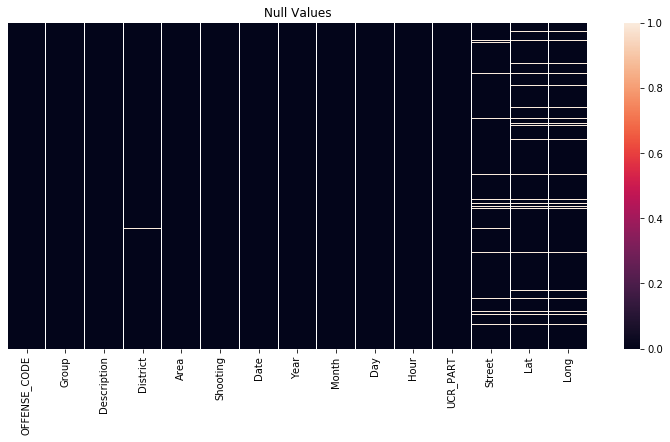

In [14]:
#Look at missing data
figure = plt.figure(figsize=(13,6))
sns.heatmap(data.isnull(),yticklabels='')
plt.title('Null Values')

Graphical view of how the NaNs are distrobuted in the data. The horizontal white lines indicate a NaN value.

In [15]:
#Check the size of dataset
data.shape

(200000, 15)

Checking the size of the dataset.

In [16]:
#Remove any rows with NaN
data = data.dropna()

We remove any data points that has NaN values so that every data point can be used for analysis.

In [17]:
#Check new size of dataset
data.shape

(184638, 15)

We check the new size of the dataset after the datapoints with NaNs has been removed. We see that we still have a lot of data and so removing the NaNs is not a problem.

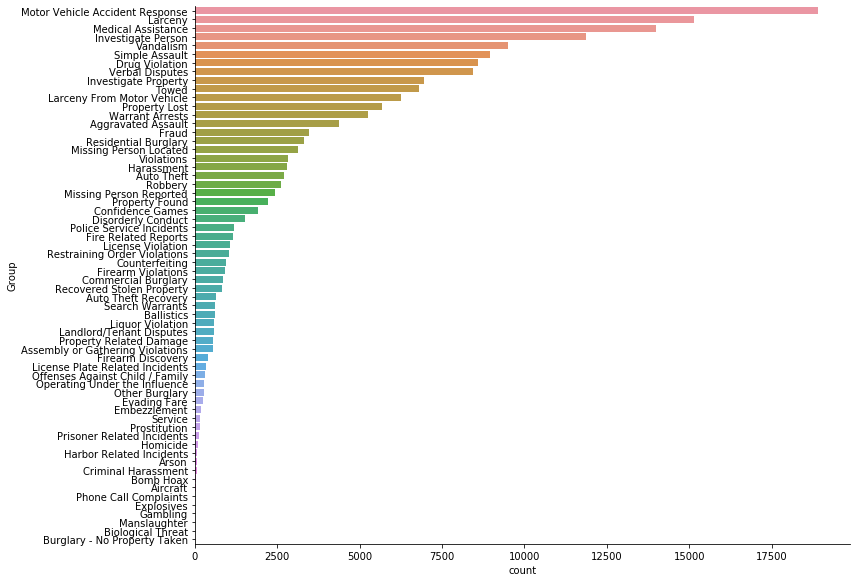

In [18]:
# Countplot for crime types without the crime group other, this is done because Other is not informative.
indexNames = data[data['Group'] == "Other" ].index
data_no_other = data.drop(indexNames)
sns.catplot(y='Group',
           kind='count',
            height=8, 
            aspect=1.5,
            order=data_no_other.Group.value_counts().index,
           data=data_no_other)

Plot of occurences of different response types. We removed the type OTHER because it is not informative. We see that the most common type the police respond to is motor vehicle accidents. 


Text(-8.825000000000003, 0.5, 'Count')

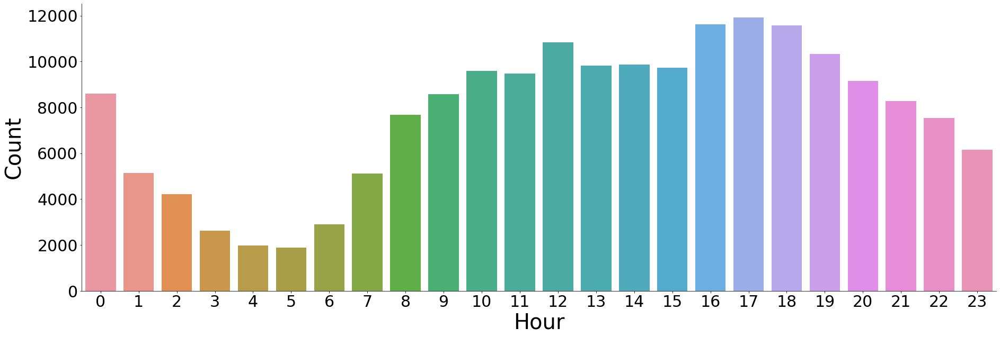

In [19]:
# Crimes by hour of the day
sns.catplot(x='Hour',
           kind='count',
            height=8.27, 
            aspect=3,
           data=data)
plt.xticks(size=30)
plt.yticks(size=30)
plt.xlabel('Hour', fontsize=40)
plt.ylabel('Count', fontsize=40)

Here we see how the amount of responses vary during the day. The responses are at a low point in the early morning and then steadily increases during the day, peaking around 18.00.

Text(-8.824999999999996, 0.5, 'Count')

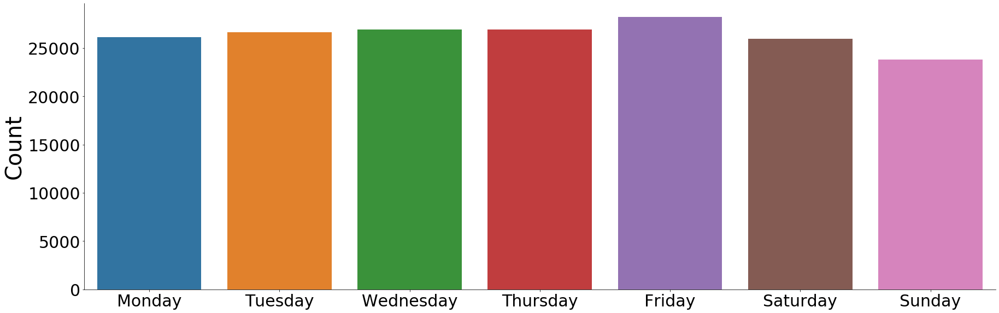

In [20]:
# Crimes by day of the week
sns.catplot(x='Day',
           kind='count',
            height=8, 
            aspect=3,
           data=data)
plt.xticks(size=30)
plt.yticks(size=30)
plt.xlabel('')
plt.ylabel('Count', fontsize=40)

Here we see how the amount of responses vary during the week. The amount of responses does not differ alot between the days but Fridays is the most busy day and Sundays the least busy.

Text(-8.824999999999996, 0.5, 'Count')

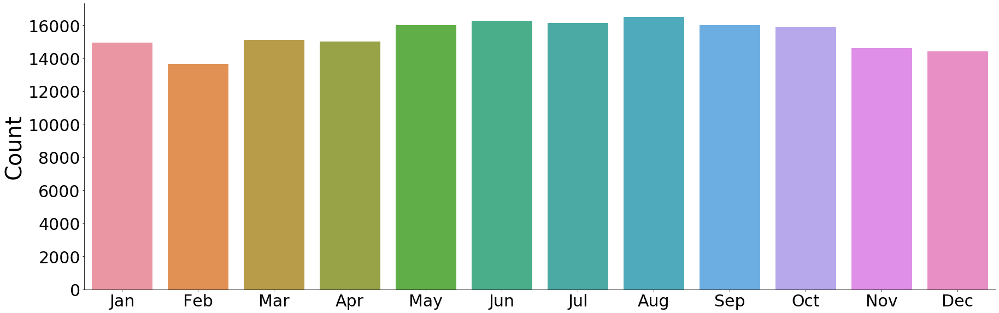

In [21]:
# Crimes by month of year
months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
sns.catplot(x='Month',
           kind='count',
            height=8, 
            aspect=3,
           data=data)
plt.xticks(np.arange(12), months, size=30)
plt.yticks(size=30)
plt.xlabel('')
plt.ylabel('Count', fontsize=40)

Here we see how the amount of responses vary during the year. The amount of responses goes up during the warmer months but there is also a lot of responses in Januari compared to the other winter months.

In [22]:
# Number every incident by day, Jan 1 = 1, Dec 31 = 364 etc...
data['Day_of_year'] = data.Date.dt.dayofyear 
# Group incident using day number and count the occurence of each day
data_holidays = data[data.Year == 2017].groupby(['Day_of_year']).size().reset_index(name='counts')

# Dates of major U.S. holidays in 2017
holidays = pd.Series(['2017-01-01', # New Years Day
                     '2017-01-16', # MLK Day
                     '2017-03-17', # St. Patrick's Day
                     '2017-04-17', # Boston marathon
                     '2017-05-29', # Memorial Day
                     '2017-07-04', # Independence Day
                     '2017-09-04', # Labor Day
                     '2017-10-10', # Veterans Day
                     '2017-11-23', # Thanksgiving
                     '2017-12-25']) # Christmas
holidays = pd.to_datetime(holidays).dt.dayofyear
holidays_names = ['NY',
                 'MLK',
                 'St Pats',
                 'Marathon',
                 'Mem',
                 'July 4',
                 'Labor',
                 'Vets',
                 'Thnx',
                 'Xmas']

Here we prepare the data so that we can plot the occurences of responses each day during 2017 with the holidays marked out on the plot.

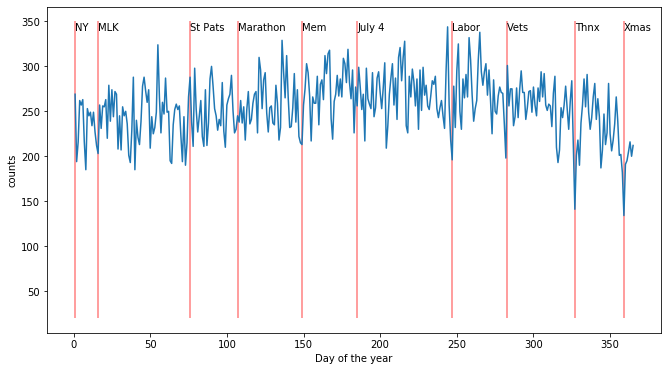

In [23]:
# Plot responses and holidays
fig, ax = plt.subplots(figsize=(11,6))
sns.lineplot(x='Day_of_year',
            y='counts',
            ax=ax,
            data=data_holidays)
plt.xlabel('Day of the year')
plt.vlines(holidays, 20, 350, alpha=0.5, color ='r')
for i in range(len(holidays)):
    plt.text(x=holidays[i], y=340, s=holidays_names[i])

Here we see that the reports generally go down during the holidays, this is contrary to popular belief that crimes increase on holidays. We do however see an increase in reports during St Patricks day compared to the souronding days, this might be because of the massive increase of alcohol consumption during this holiday.

In [24]:
# Create basic Folium crime map
crime_map = folium.Map(location=[42.3125,-71.0875], 
                       tiles = "Stamen Toner",
                      zoom_start = 11)

# Add data for heatmp 
data_heatmap = data
data_heatmap = data[['Lat','Long']]
data_heatmap = data.dropna(axis=0, subset=['Lat','Long'])
data_heatmap = [[row['Lat'],row['Long']] for index, row in data_heatmap.iterrows()]
HeatMap(data_heatmap, radius=8).add_to(crime_map)

# Plot!
crime_map

Here we see a heatmap of police responses. The blue areas represent the lowest frequency and the red areas represents the highest frequency. We can see from the heatmap that downtown Boston is the area where the most responses happen. 

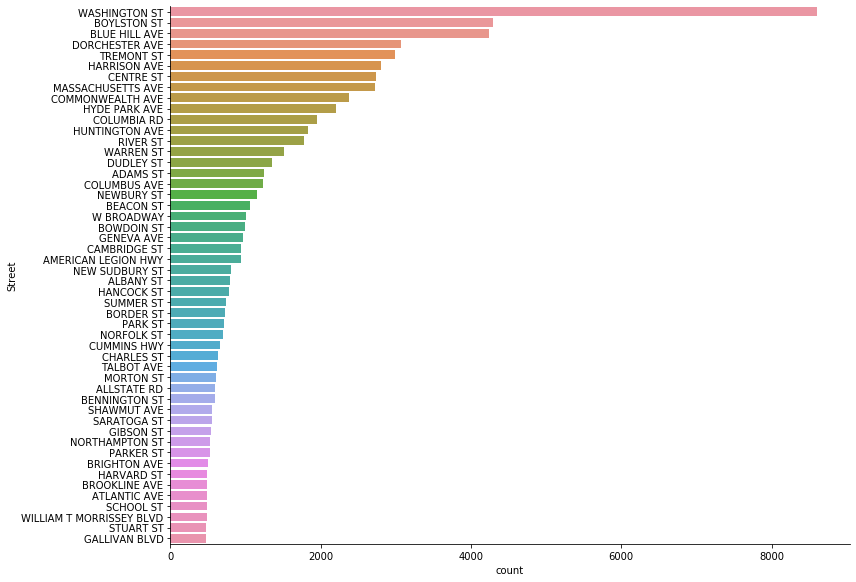

In [25]:
# Police response for top 50 streets
sns.catplot(y='Street',
           kind='count',
            height=8, 
            aspect=1.5,
            order=data.Street.value_counts().index[0:50],
           data=data)

Here we see a list of the top 50 streets where the most responses happen. Washington Street is way above the rest, this is probably because its a very long street and it goes through downtown Boston.

In [26]:
# Create basic Folium crime map for shootings
crime_map_shooting = folium.Map(location=[42.3125,-71.0875], 
                       tiles = "Stamen Toner",
                      zoom_start = 11)

# Add data for heatmp 
data_heatmap = data[data.Shooting != "N"]
data_heatmap.shape
data_heatmap = data[['Lat','Long']]
data_heatmap = data.dropna(axis=0, subset=['Lat','Long'])
data_heatmap = [[row['Lat'],row['Long']] for index, row in data_heatmap.iterrows()]
HeatMap(data_heatmap, radius=7).add_to(crime_map_shooting)

# Plot!
crime_map_shooting

Here we see a heatmap of the shootings in Boston, we see that the hotspots on this map are similiar to the heatmap above. This indicates that there is no clear difference between where shootings happen compared to where responses on average occur.

In [27]:
# See how many percent of responds involves shootings.
data.Shooting.describe()

count     184638
unique         2
top            N
freq      184014
Name: Shooting, dtype: object

We take a look at the Shooting column to see how many of the respones was a shooting.

In [28]:
# Calculate percentage of responses are shootings
perc_shooting = 184014/184638
1-perc_shooting

0.0033795860007148626

We see that less than 0.5 % of the responses are shootings. This shows that its quite uncommon for the police officers to use their guns, even in America.

Text(0.5, 1, 'Crime related to shootings')

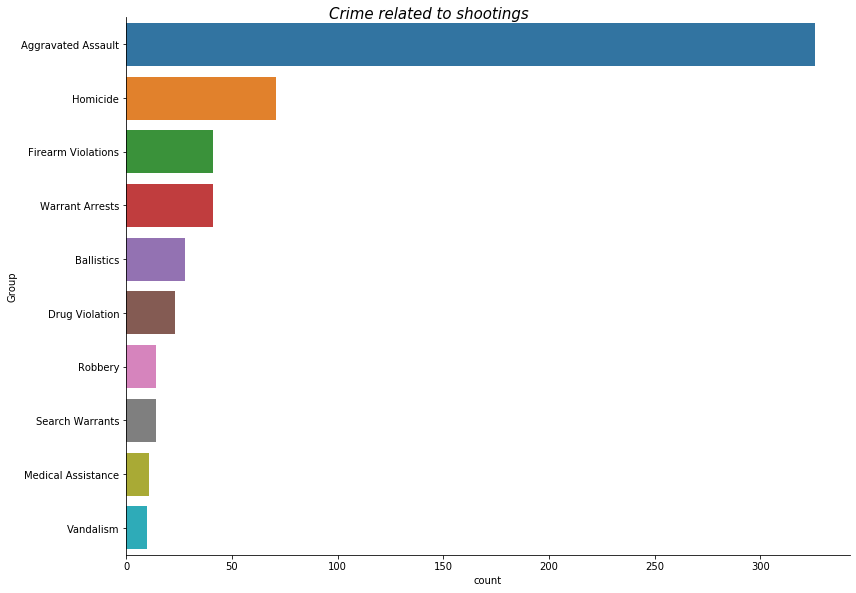

In [29]:
# Plot response type related to shootings.
data_shooting = data[data.Shooting != "N"]
sns.catplot(y='Group',
           kind='count',
            height=8, 
            aspect=1.5,
            order=data_shooting.Group.value_counts().index[0:10],
           data=data_shooting)
plt.suptitle("Crime related to shootings", y=1, fontsize=15, fontweight=0, color='black', style='italic')

Here we can see that the most common response type that involves shootings are Aggravated Assualt.

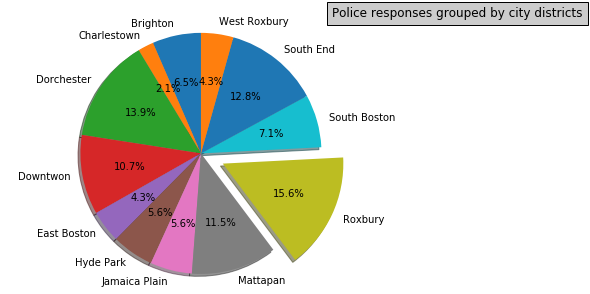

In [31]:
#Create Pieplot for how responses are distrobuted between the districts
labels = data['District'].astype('category').cat.categories.tolist()
counts = data['District'].value_counts()
sizes = [counts[var_cat] for var_cat in labels]
# only "explode" the 9nd slice (i.e. 'Roxbury')
explode = (0, 0, 0, 0, 0, 0, 0, 0, 0.2, 0, 0 ,0)  
fig1, ax1 = plt.subplots()
ax1.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%',
        shadow=True, startangle=90)# Equal aspect ratio ensures that pie is drawn as a circle
ax1.axis('equal')  
plt.tight_layout()
plt.title("Police responses grouped by city districts", loc="center",
          bbox={'facecolor':'0.8', 'pad':5}, position=(1.1,1))
plt.show()


Here we see that Roxbury with 15.6 percent is the district with the most police responses.